# GIS

## Import libraries

In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np
from scipy.spatial import Voronoi, voronoi_plot_2d
from shapely.geometry import Polygon, Point
import pandas as pd

# from google.colab import drive
# drive.mount('/content/drive')

## Load map of district

Index(['objectid', 'district', 'globalid', 'shape_Leng', 'shape_Area',
       'geometry'],
      dtype='object')


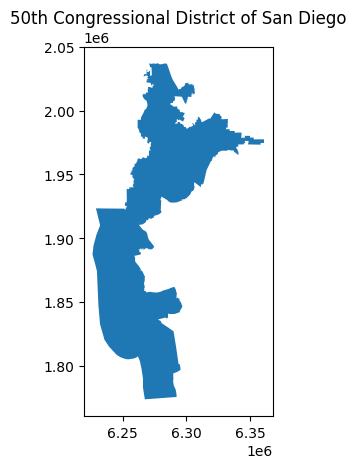

In [2]:
# Load the shapefile containing congressional districts in California
shapefile_path = "./Data/Congressional_Districts_shapefile/Congressional_Districts.shp"  # Replace with your shapefile path
gdf_districts = gpd.read_file(shapefile_path)

# Inspect the columns to check the district identifier (e.g., 'DISTRICT' or 'CD') to use for filtering
print(gdf_districts.columns)

# Filter for the 50th Congressional District
district_50th = gdf_districts[gdf_districts['district'] == '50']  # Replace 'DISTRICT' with the correct column name if different
districts_not_50th = gdf_districts[gdf_districts['district'] != '50']  # Replace 'DISTRICT' with the correct column name if different

# Plot the 50th district
district_50th.plot()

# Add a title and show the plot
plt.title("50th Congressional District of San Diego")
plt.show()

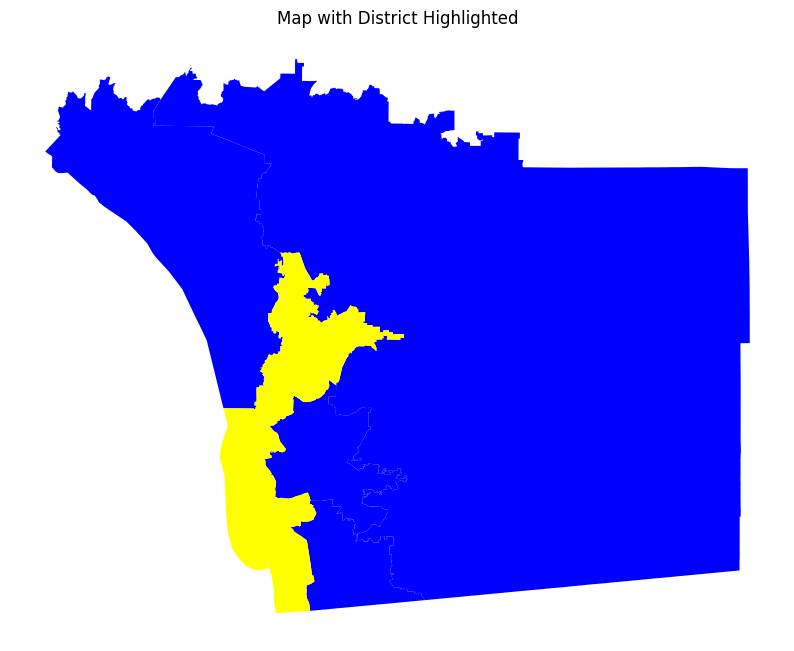

In [3]:
# Plot the map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the non-district areas first in blue
gdf_districts_not_50 = gdf_districts[gdf_districts['district']!='50'].plot(color='blue', ax=ax)

# Plot the district in yellow on top
district_50th.plot(color='yellow', ax=ax)

# Customize the plot 
plt.title("Map with District Highlighted")
plt.axis('off')  # Hide the axis ticks and labels

plt.show()

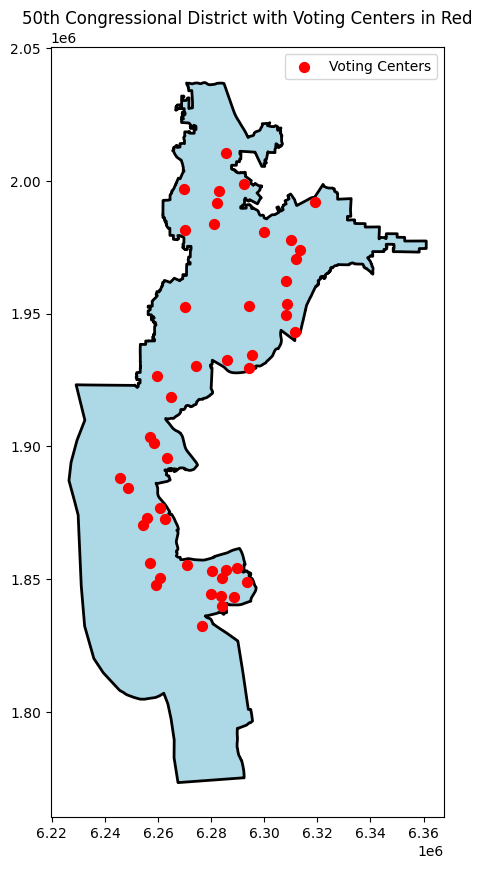

In [4]:
shapefile_path = "./Data/Vote_Centers_2024_11_05_shapefile/Vote_Centers_2024_11_05.shp"
gdf_voting = gpd.read_file(shapefile_path)

# Ensure the coordinates are the same
gdf_voting = gdf_voting.to_crs(district_50th.crs)

# Perform a spatial join to find voting centers within the 50th district using 'predicate' instead of 'op'
voting_centers_in_50th = gpd.sjoin(gdf_voting, district_50th, how="inner", predicate="within")

# Plot the 50th district boundary
ax = district_50th.plot(edgecolor='black', facecolor='lightblue', linewidth=2, figsize=(10, 10))

# Plot the voting centers in red
voting_centers_in_50th.plot(ax=ax, color='red', marker='o', markersize=50, label='Voting Centers')

# Add title and legend
plt.title("50th Congressional District with Voting Centers in Red")
plt.legend()

# Show the plot
plt.show()

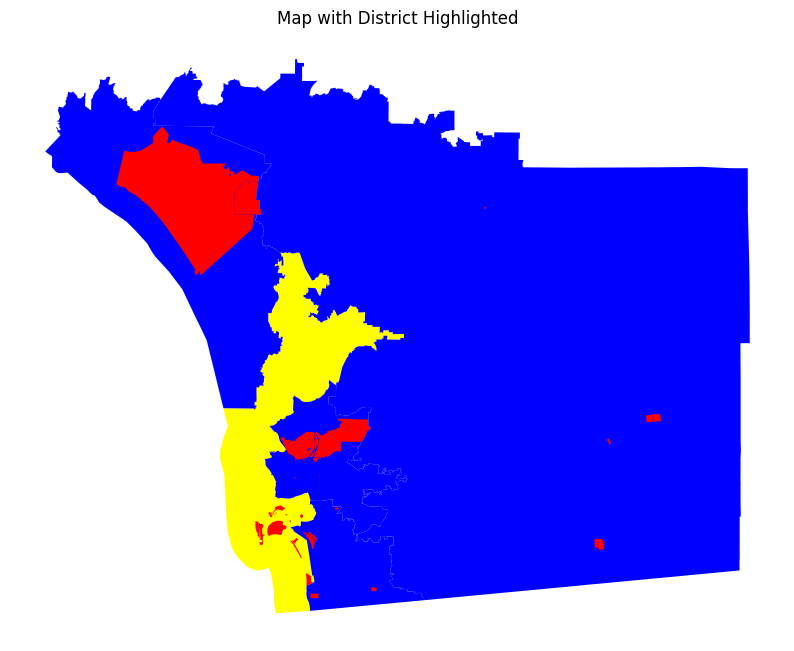

In [5]:
shapefile_path = "./Data/Military_Facilities_shapefile/Military_Facilities.shp"  # Replace with your shapefile path
military = gpd.read_file(shapefile_path)

# Plot the map
fig, ax = plt.subplots(1, 1, figsize=(10, 10))

# Plot the non-district areas first in yellow
district_50th.plot(color='yellow', ax=ax)

# Plot the district in yellow on top
districts_not_50th.plot(color='blue', ax=ax)

# Plot the military facilities in red
military.plot(ax=ax, color='red', label='Military Facilities')

# Customize the plot (optional)
plt.title("Map with District Highlighted")
plt.axis('off')  # Hide the axis ticks and labels

plt.show()

/tmp/ipykernel_23008/3965545986.py:8: UserWarning: `keep_geom_type=True` in overlay resulted in 1350 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  blocks_in_50th = gpd.overlay(blocks, district_50th, how='intersection')


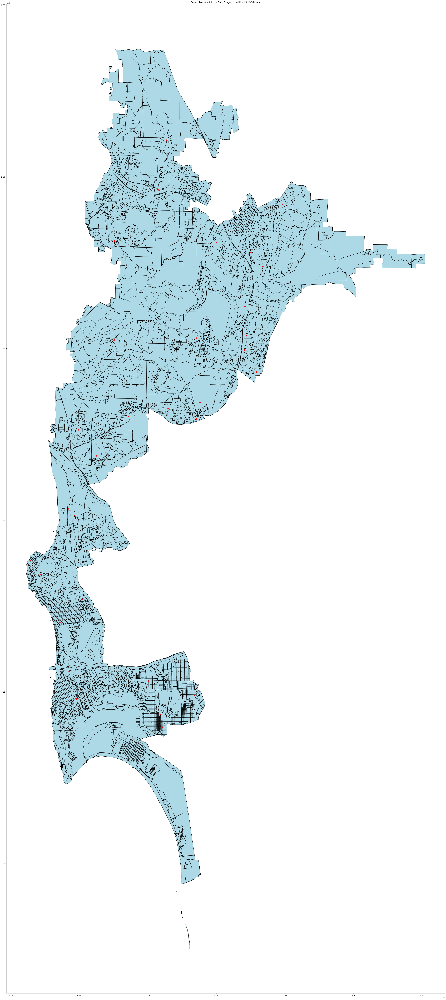

In [6]:
shapefile_path = "./Data/Census_Blocks_2020_shapefile/Census_Blocks_2020.shp"  # Replace with your shapefile path
blocks = gpd.read_file(shapefile_path)

# Ensure both datasets use the same CRS (Coordinate Reference System)
blocks = blocks.to_crs(district_50th.crs)

# Perform a spatial intersection to keep only the census blocks inside the 50th Congressional District
blocks_in_50th = gpd.overlay(blocks, district_50th, how='intersection')

# Plot the 50th district's census blocks
ax = blocks_in_50th.plot(edgecolor='black', facecolor='lightblue', figsize=(100, 100))

voting_centers_in_50th.plot(ax=ax, color='red', marker='o', markersize=50, label='Voting Centers')

# Add title and labels
plt.title("Census Blocks within the 50th Congressional District of California")
plt.show()

/tmp/ipykernel_23008/526854758.py:28: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


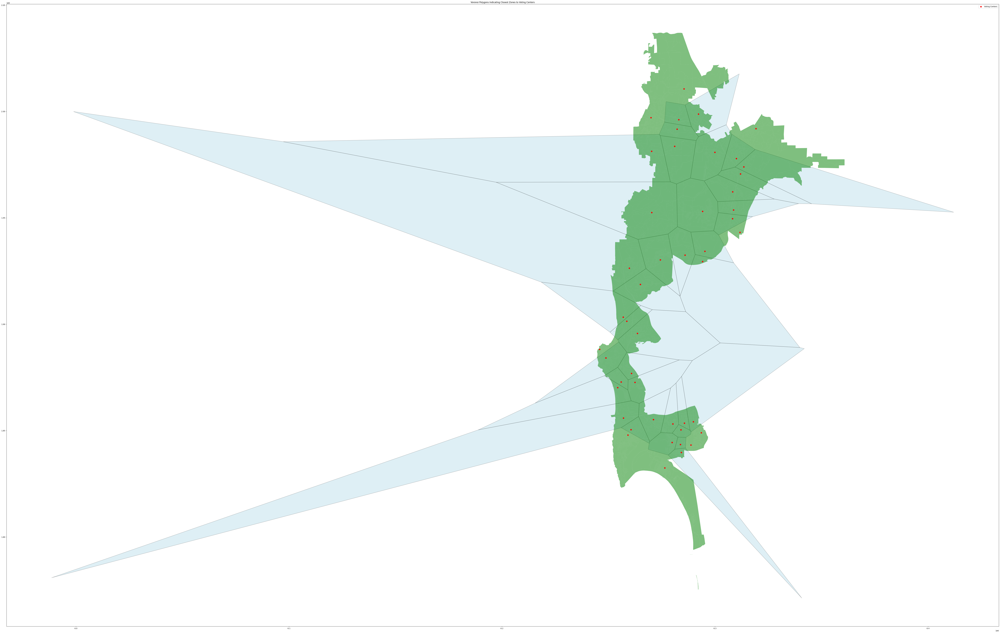

In [7]:
points = np.array(list(zip(voting_centers_in_50th.geometry.x, voting_centers_in_50th.geometry.y)))
vor = Voronoi(points)

# Create a GeoDataFrame to store the Voronoi polygons
voronoi_polygons = []

# For each Voronoi region, create a polygon
for region in vor.regions:
    if not -1 in region and len(region) > 0:  # Exclude regions that extend to infinity
        polygon = Polygon([vor.vertices[i] for i in region])
        voronoi_polygons.append(polygon)

# Convert the polygons into a GeoDataFrame
gdf_voronoi = gpd.GeoDataFrame(geometry=voronoi_polygons)

# Plot the Voronoi polygons
fig, ax = plt.subplots(figsize=(100, 100))

# Plot the Voronoi polygons (zones)
gdf_voronoi.plot(ax=ax, edgecolor='black', facecolor='lightblue', alpha=0.4)

# Plot the voting centers on top of the Voronoi polygons
blocks_in_50th.plot(ax=ax, color='green', label='Census Blocks', alpha=.5)
voting_centers_in_50th.plot(ax=ax, color='red', marker='o', markersize=50, label='Voting Centers')

# Add title and legend
plt.title("Voronoi Polygons Indicating Closest Zones to Voting Centers")
plt.legend()

# Show the plot
plt.show()

/tmp/ipykernel_23008/2102413159.py:30: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


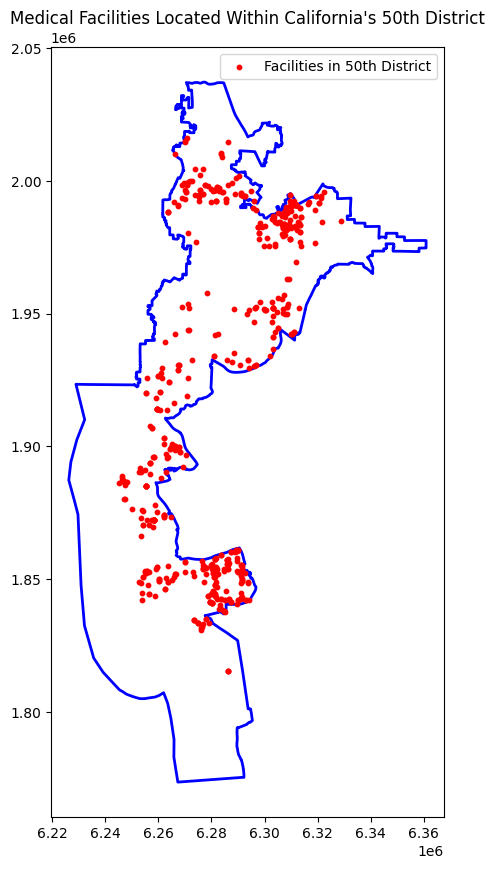

In [8]:
# Load shapefiles for facilities
shapefile_paths = {
    "Adult_Residential_Facilities": "./Data/Adult_Residential_Facilities_shapefile/Adult_Residential_Facilities.shp",
    "CA_Bridge_Hospitals": "./Data/CA_Bridge_Hospitals_shapefile/CA_Bridge_Hospitals.shp",
    "Child_Care_Centers": "./Data/Child_Care_Centers_shapefile/Child_Care_Centers.shp",
    "Cool_Zones": "./Data/Cool_Zones_shapefile/Cool_Zones.shp",
    "Healthcare_Facilities": "./Data/Healthcare_Facilities_shapefile/Healthcare_Facilities.shp",
    "Medication_Assisted_Treatment_Locations": "./Data/Medication_Assisted_Treatment_Locations_shapefile/Medication_Assisted_Treatment_Locations.shp"
}

# Read each facility shapefile
facility_dfs = [gpd.read_file(path) for path in shapefile_paths.values()]

# Concatenate all facilities into one GeoDataFrame
all_facilities = pd.concat(facility_dfs, ignore_index=True)
gdf_all_facilities = gpd.GeoDataFrame(all_facilities, geometry='geometry')

# Ensure both GeoDataFrames use the same CRS
gdf_all_facilities = gdf_all_facilities.to_crs(district_50th.crs)

facilities_in_50th = gpd.sjoin(gdf_all_facilities, district_50th, how="inner", predicate="within")

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
district_50th.plot(ax=ax, edgecolor='blue', linewidth=2, facecolor="none", label='50th District')
facilities_in_50th.plot(ax=ax, color='red', markersize=10, label='Facilities in 50th District')

# Add title and legend
plt.title("Medical Facilities Located Within California's 50th District")
plt.legend()
plt.show()

/tmp/ipykernel_23008/2253233910.py:26: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


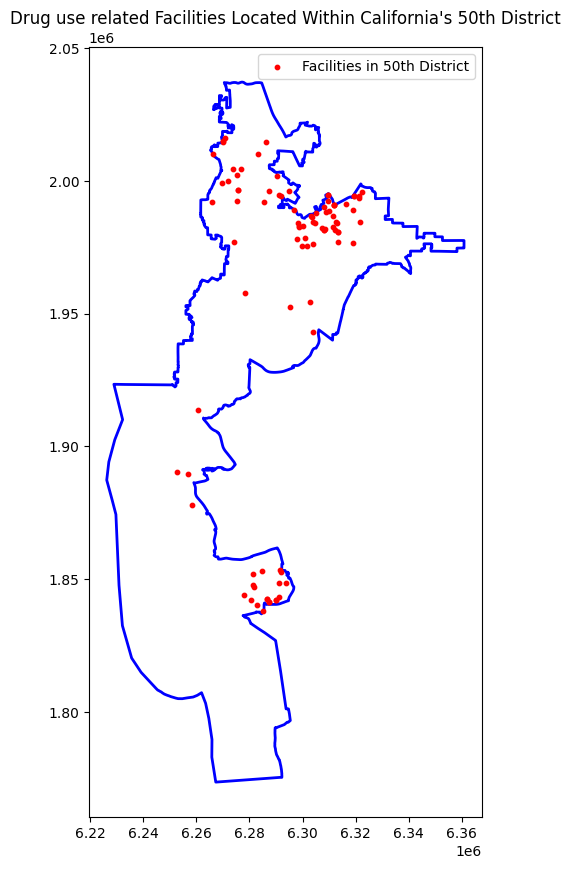

In [9]:
# Load shapefiles for facilities
shapefile_paths = {
    "Naloxone_Distribution_Locations": "./Data/Naloxone_Distribution_Locations_shapefile/Naloxone_Distribution_Locations.shp",
    "Adult_Residential_Facilities": "./Data/Adult_Residential_Facilities_shapefile/Adult_Residential_Facilities.shp",
}

# Read each facility shapefile
facility_dfs = [gpd.read_file(path) for path in shapefile_paths.values()]

# Concatenate all facilities into one GeoDataFrame
all_facilities = pd.concat(facility_dfs, ignore_index=True)
gdf_all_facilities = gpd.GeoDataFrame(all_facilities, geometry='geometry')

# Ensure both GeoDataFrames use the same CRS
gdf_all_facilities = gdf_all_facilities.to_crs(district_50th.crs)

facilities_in_50th = gpd.sjoin(gdf_all_facilities, district_50th, how="inner", predicate="within")

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))
district_50th.plot(ax=ax, edgecolor='blue', linewidth=2, facecolor="none", label='50th District')
facilities_in_50th.plot(ax=ax, color='red', markersize=10, label='Facilities in 50th District')

# Add title and legend
plt.title("Drug use related Facilities Located Within California's 50th District")
plt.legend()
plt.show()

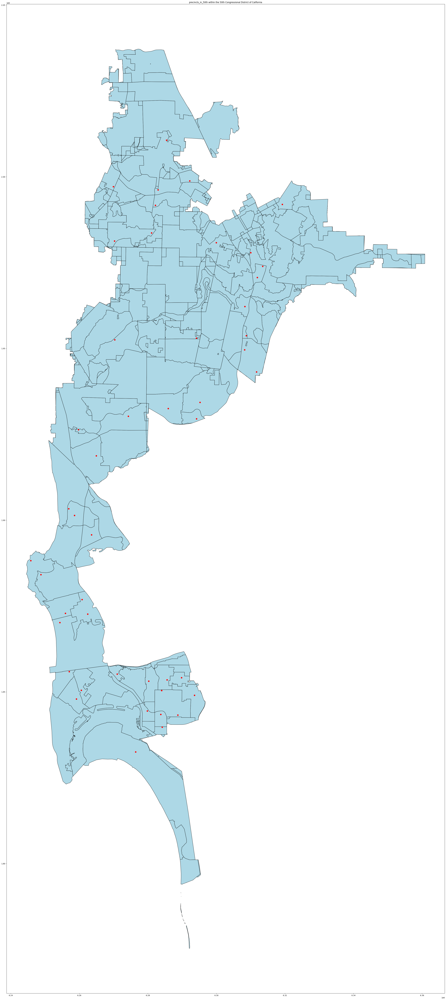

In [10]:
shapefile_path = "./Data/ca_vest_20/ca_vest_20.shp"
electionPrecinct=gpd.read_file(shapefile_path)

# Ensure both datasets use the same CRS (Coordinate Reference System)
precincts = electionPrecinct.to_crs(district_50th.crs)

precincts_in_50th = gpd.overlay(precincts, district_50th, how='intersection')

# Plot the 50th district's census blocks
ax = precincts_in_50th.plot(edgecolor='black', facecolor='lightblue', figsize=(100, 100))

voting_centers_in_50th.plot(ax=ax, color='red', marker='o', markersize=50, label='Voting Centers')

# Add title and labels
plt.title("precincts_in_50th within the 50th Congressional District of California")
plt.show()

In [11]:
# Load and filter data (Change the commented line for different elections)
results = pd.read_csv("./Data/PRESIDENT_precinct_general.csv") 
# results = pd.read_csv("./Data/HOUSE_precinct_general.csv")

results = results.dropna()
results = results[results['county_name'] == 'SAN DIEGO']

# Step 1: Sum votes by precinct and party
vote_sums = results.groupby(['precinct', 'party_detailed'], as_index=False)['votes'].sum()

# Step 2: Merge the summed votes back with the original DataFrame to retain other columns
results = results.drop(columns='votes').drop_duplicates(['precinct', 'party_detailed'])
results = results.merge(vote_sums, on=['precinct', 'party_detailed'], how='left')

# Step 3: Final grouping to keep the required columns only
results = results.groupby(['precinct', 'party_detailed'], as_index=False).agg({
    'votes': 'first',  # Use the summed votes
    'precinct': 'first',  # Keep first occurrence of precinct
    'candidate': 'first'  # Keep first occurrence of candidate
})

results=results[results['votes']!=0]

results['precinct'] = results['precinct'].str.split('_').str[0]
results['precinct'] = results['precinct'].apply(lambda x: x if not x.startswith('0') else x[1:])

# Display the result
results.columns

/tmp/ipykernel_23008/532685268.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  results = pd.read_csv("./Data/PRESIDENT_precinct_general.csv")


Index(['party_detailed', 'votes', 'precinct', 'candidate'], dtype='object')

In [12]:
shapefile_path = "./Data/ca_vest_20/ca_vest_20.shp"
electionPrecinct=gpd.read_file(shapefile_path)
electionPrecinct[electionPrecinct['COUNTY']=='San Diego']

,COUNTY,CNTY_CODE,FIPS_CODE,SRPREC_KEY,SRPREC,ADDIST,CDDIST,SDDIST,BEDIST,G20PREDBID,G20PRERTRU,G20PRELJOR,G20PREGHAW,G20PREAFUE,G20PREPLAR,geometry
14451,San Diego,37,6073,6073105000,105000,77,52,39,4,2023,1643,31,11,10,1,"POLYGON ((-13029773.953 3901371.127, -13029726..."
14452,San Diego,37,6073,6073105010,105010,77,52,39,4,603,487,16,4,8,1,"POLYGON ((-13031297.46 3902248.482, -13031272...."
14453,San Diego,37,6073,6073105160,105160,77,52,39,4,4419,3190,96,30,19,5,"POLYGON ((-13032959.602 3898336.382, -13032929..."
14454,San Diego,37,6073,6073105200,105200,77,52,39,4,279,203,4,1,1,0,"POLYGON ((-13030766.061 3897715.726, -13030737..."
14455,San Diego,37,6073,6073105800,105800,77,52,39,4,318,277,6,3,1,1,"POLYGON ((-13031881.923 3899244.624, -13031880..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15599,San Diego,37,6073,6073999835,999835,80,53,40,4,0,0,0,0,0,0,"MULTIPOLYGON (((-13028256.9 3847315.037, -1302..."
15600,San Diego,37,6073,6073999836,999836,80,53,40,4,0,1,0,0,0,0,"MULTIPOLYGON (((-13030206.669 3847705.279, -13..."
15601,San Diego,37,6073,6073999838,999838,80,53,40,4,0,0,0,0,0,0,"POLYGON ((-13028193.441 3845438.397, -13028184..."
15602,San Diego,37,6073,6073999840,999840,80,53,40,4,0,1,0,0,0,0,"POLYGON ((-13027964.519 3845768.528, -13027963..."


<Axes: >

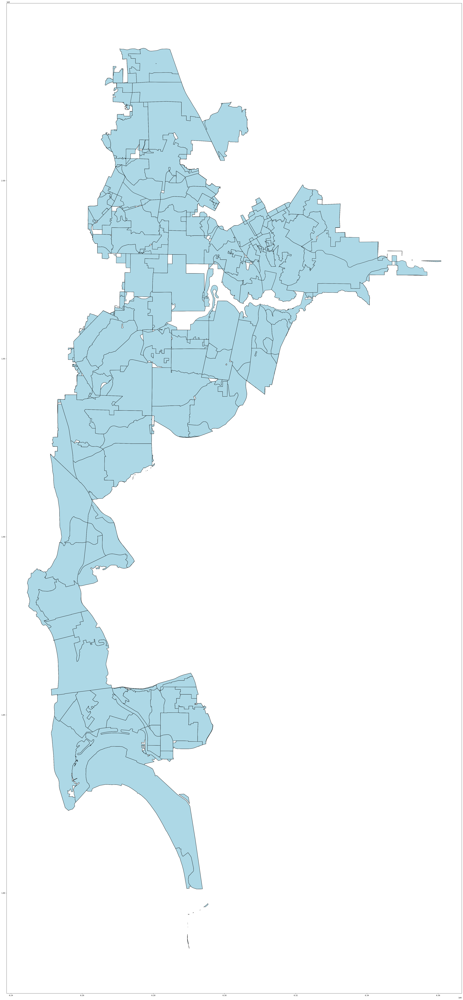

In [13]:
# Perform the join on precinct and SRPREC_KEY
merged_data = precincts_in_50th.merge(results, left_on='SRPREC_KEY', right_on='precinct', how='inner')

# Display the merged data
merged_data.plot(edgecolor='black', facecolor='lightblue', figsize=(100, 100))

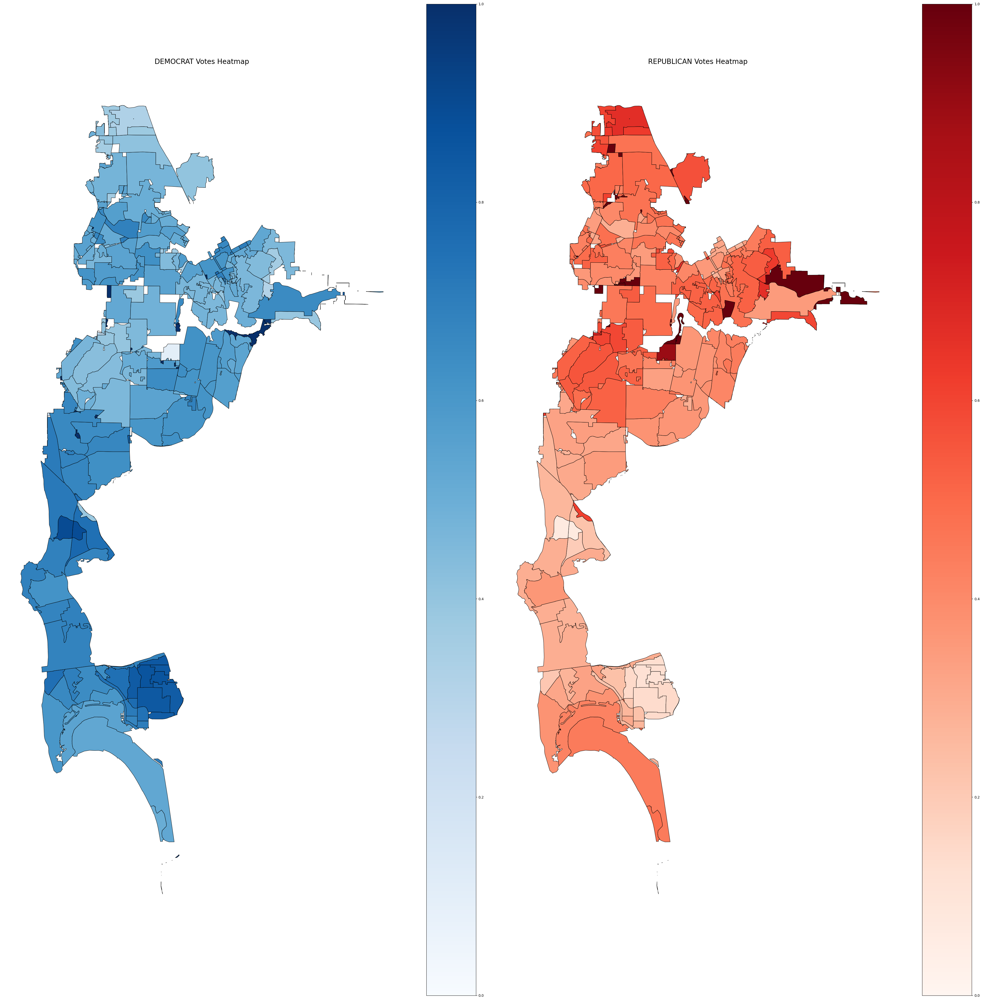

In [14]:
# Define the figure size for all plots
# fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(40, 40))  # Adjust dimensions as needed for visibility
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(40, 40))  # Adjust dimensions as needed for visibility
party_names = ['DEMOCRAT', 'REPUBLICAN']#, 'GREEN', 'LIBERTARIAN', 'ALLIANCE', 'SOCIALISM AND LIBERATION']
color_maps = ['Blues', 'Reds']#, 'Greens', 'Greys', 'Oranges', 'Purples']

merged_data['total_votes'] = merged_data.groupby('precinct')['votes'].transform('sum')
merged_data['vote_percentage'] = (merged_data['votes'] / merged_data['total_votes'])

# Loop over each party to generate a heatmap
for party, color_map, ax in zip(party_names, color_maps, axes.flatten()):
    # Filter data for the current party
    party_data = merged_data[merged_data['party_detailed'] == party]

    # Plot the heatmap for the current party's votes
    party_data.plot(column='vote_percentage', cmap=color_map, linewidth=0.8, edgecolor='black', legend=True, ax=ax, vmin=0, vmax=1)

    # Set title and remove axis for better clarity
    ax.set_title(f"{party} Votes Heatmap", fontsize=20)
    ax.axis('off')

plt.tight_layout()
plt.show()

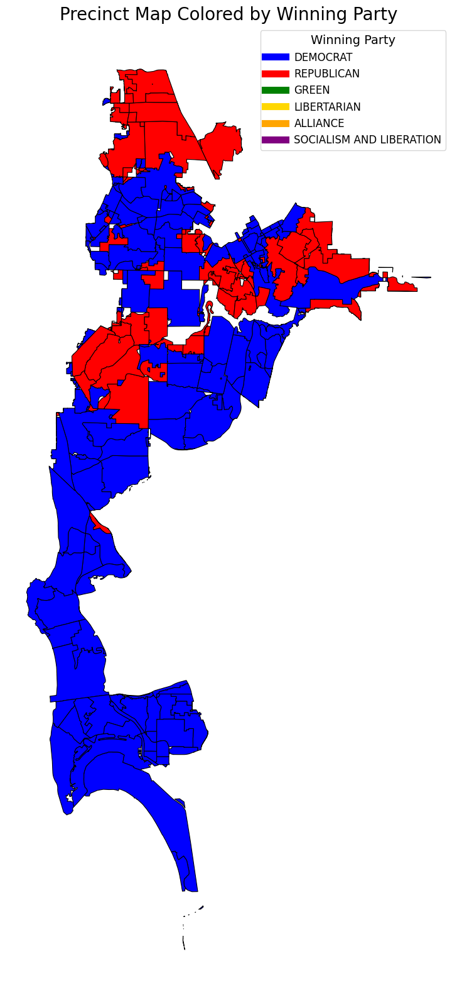

In [15]:
# Identify the party with the highest vote percentage in each precinct
merged_data['winning_party'] = merged_data.groupby('precinct')['vote_percentage'].transform(lambda x: x.idxmax())
merged_data['winning_party'] = merged_data.loc[merged_data['winning_party'], 'party_detailed'].values

# Create a color mapping for each party
party_colors = {
    'DEMOCRAT': 'blue',
    'REPUBLICAN': 'red',
    'GREEN': 'green',
    'LIBERTARIAN': 'gold',
    'ALLIANCE': 'orange',
    'SOCIALISM AND LIBERATION': 'purple'
}
merged_data['color'] = merged_data['winning_party'].map(party_colors)

# Remove duplicates to keep only one row per precinct
merged_data_unique = merged_data.drop_duplicates(subset='precinct')

# Plot the map with winning party colors
fig, ax = plt.subplots(figsize=(20, 20))
merged_data_unique.plot(color=merged_data_unique['color'], linewidth=0.8, edgecolor='black', ax=ax)

# Add title and legend
ax.set_title("Precinct Map Colored by Winning Party", fontsize=20)
for party, color in party_colors.items():
    ax.plot([], [], color=color, label=party, linewidth=8)  # Dummy lines for legend
ax.legend(title="Winning Party", fontsize=12, title_fontsize=14)

# Remove axis for clarity
ax.axis('off')
plt.show()

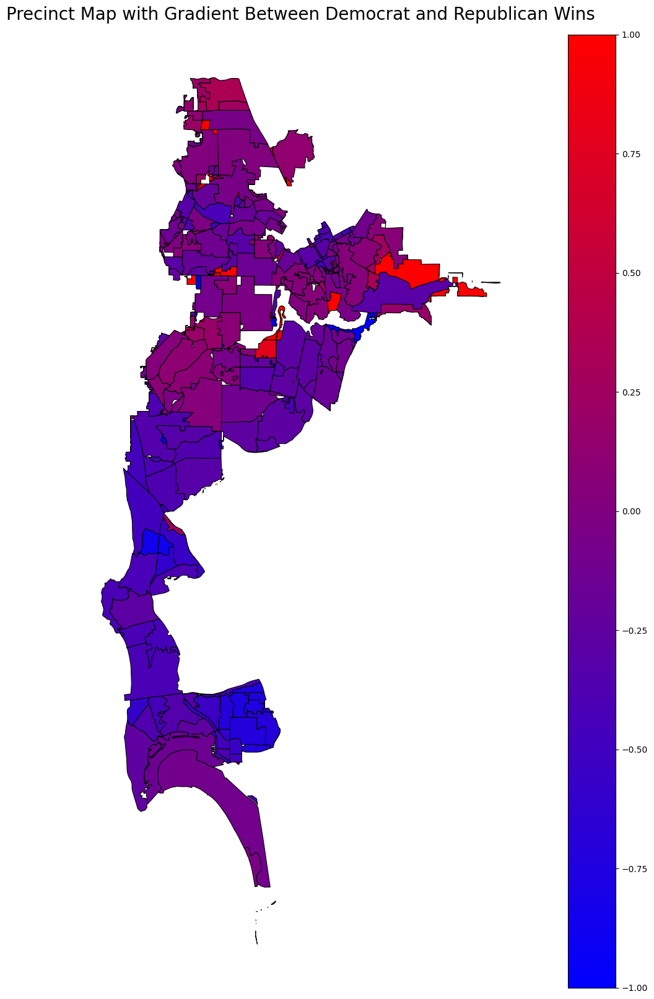

In [16]:


# Create a custom colormap that transitions from blue to red
cmap = mcolors.LinearSegmentedColormap.from_list("DemRep", ["blue", "red"])

# Calculate the difference in vote percentage between Democrat and Republican
merged_data['vote_diff'] = merged_data.apply(lambda row: row['vote_percentage'] if row['party_detailed'] == 'REPUBLICAN' else -row['vote_percentage'], axis=1)

# Sum the vote differences per precinct to get a measure of the overall leaning
precinct_vote_diff = merged_data.groupby('precinct')['vote_diff'].sum().reset_index()

# Merge the vote difference back into the precincts data
merged_data_unique = merged_data_unique.merge(precinct_vote_diff, on='precinct')

# Plot the map with the gradient
fig, ax = plt.subplots(figsize=(20, 20))
merged_data_unique.plot(column='vote_diff', cmap=cmap, linewidth=0.8, edgecolor='black', ax=ax, legend=True)

# Add title and legend
ax.set_title("Precinct Map with Gradient Between Democrat and Republican Wins", fontsize=20)
ax.axis('off')  # Remove axis for clarity

plt.show()

/tmp/ipykernel_23008/2962201680.py:25: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  party_data.plot(column='vote_percentage', cmap=color_map, linewidth=0.8, edgecolor='black', legend=True, ax=ax, vmin=0, vmax=1)
/tmp/ipykernel_23008/2962201680.py:25: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  party_data.plot(column='vote_percentage', cmap=color_map, linewidth=0.8, edgecolor='black', legend=True, ax=ax, vmin=0, vmax=1)
/tmp/ipykernel_23008/2962201680.py:25: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  party_data.plot(column='vote_percentage', cmap=color_map, linewidth=0.8, edgecolor='black', legend=True, ax=ax, vmin=0, vmax=1)
/tmp/ipykernel_23008/2962201680.py:25: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  party_data.plot(column='vote_percentage', cmap=color_map, linewidth=0.8,

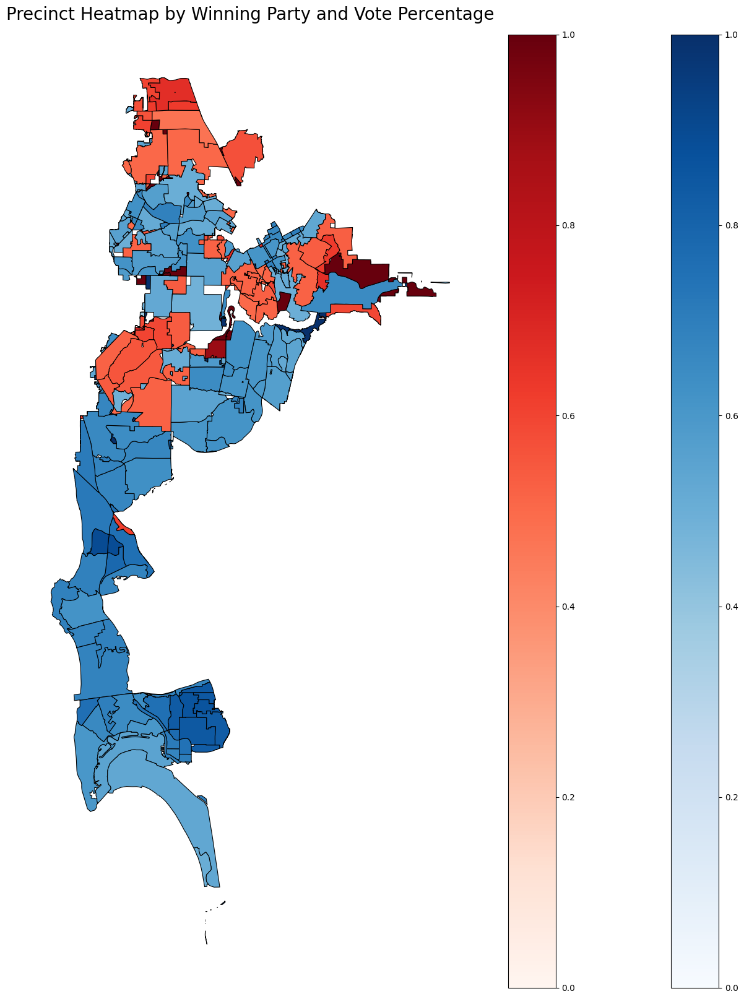

In [17]:
# Calculate total votes per precinct and the vote percentage for each party
merged_data['total_votes'] = merged_data.groupby('precinct')['votes'].transform('sum')
merged_data['vote_percentage'] = merged_data['votes'] / merged_data['total_votes']

# Identify the party with the highest vote percentage in each precinct
winning_party_data = merged_data.loc[merged_data.groupby('precinct')['vote_percentage'].idxmax()]

# Map party to colors for a color map
party_colors = {
    'DEMOCRAT': 'Blues',
    'REPUBLICAN': 'Reds',
    'GREEN': 'Greens',
    'LIBERTARIAN': 'YlOrBr',
    'ALLIANCE': 'Oranges',
    'SOCIALISM AND LIBERATION': 'Purples'
}

# Plot each party's precinct heatmap, showing strength of the vote percentage
fig, ax = plt.subplots(figsize=(20, 20))
for party, color_map in party_colors.items():
    # Filter data for the current party's winning precincts
    party_data = winning_party_data[winning_party_data['party_detailed'] == party]

    # Plot heatmap for the party, with color based on vote percentage strength
    party_data.plot(column='vote_percentage', cmap=color_map, linewidth=0.8, edgecolor='black', legend=True, ax=ax, vmin=0, vmax=1)

# Add title and remove axis for clarity
ax.set_title("Precinct Heatmap by Winning Party and Vote Percentage", fontsize=20)
ax.axis('off')
plt.show()